# Исследование рынка общественного питания Москвы

## Введение

Для инвесторов из фонда "Shut up and take my money" проведём исследование рынка заведений общественного питания Москвы и посмотрим, какие существуют закономерности, особенности и дадим рекомендации по открытию новой точки. Для этого у нас в распоряжении есть датасет с информацией, взятой из открытых источников либо добавленной пользователями в сервисах Яндекс.Карты и Яндекс.Бизнес.

*Ход исследования планируется следующим образом*:
- познакомимся с данными
- проведём предобработку для дальнейшего анализа
- исследуем данные на зависимости между показателями
- визуализируем геоданные  

*Предоставленные данные*:  

`name` — название заведения;  
`address` — адрес заведения;  
`category` — категория заведения;  
`hours` — информация о днях и часах работы;  
`lat` — широта географической точки, в которой находится заведение;  
`lng` — долгота географической точки, в которой находится заведение;  
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах;  
`price` — категория цен в заведении;  
`avg_bill` — средняя стоимость заказа в виде диапазона;  
`middle_avg_bill` — среднее из столбца `avg_bill`;  
`middle_coffee_cup` — цена чашки капучино;  
`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;  
`district` — административный район, в котором находится заведение;  
`seats` — количество посадочных мест.

## Знакомство с данными

In [1]:
# импортирую библиотеки
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import pylab
import plotly.io as pio
import plotly.graph_objs as go
import numpy as np
import plotly.express as px
import folium
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# задаю стиль графиков
pio.templates.default = 'simple_white'

In [3]:
# читаю файлы и объявляю геолокацию
data = pd.read_csv('C:\\Users\DNS\Downloads\moscow_places.csv')

with open('C:\\Users\\DNS\\Downloads\\admin_level_geomap.geojson', 'r') as f:
    state_geo = json.load(f)
    
moscow_lat, moscow_lng = 55.751244, 37.618423

In [4]:
# знакомлюсь с данными
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Всего 14 столбцов, в некоторых имеются пропущенные значения. Посмотрим подробнее:

In [5]:
# смотрю общую информацию
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего 8406 записей.  
Имеются пропуски в числовых и строковых данных. Посмотрим, как эти данные распределены:

In [6]:
# проверяю распределение всех данных
data.describe(include = 'all')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406,8406,8406,8406,7870,8406.000000,8406.000000,8406.000000,3315,3816,3149.000000,535.000000,8406.000000,4795.000000
unique,5614,8,5753,9,1307,NaN,NaN,NaN,4,897,NaN,NaN,NaN,NaN
top,Кафе,кафе,"Москва, проспект Вернадского, 86В",Центральный административный округ,"ежедневно, 10:00–22:00",NaN,NaN,NaN,средние,Средний счёт:1000–1500 ₽,NaN,NaN,NaN,NaN
freq,189,2378,28,2242,759,NaN,NaN,NaN,2117,241,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,55.750109,37.608570,4.229895,NaN,NaN,958.053668,174.721495,0.381275,108.421689
std,NaN,NaN,NaN,NaN,NaN,0.069658,0.098597,0.470348,NaN,NaN,1009.732845,88.951103,0.485729,122.833396
min,NaN,NaN,NaN,NaN,NaN,55.573942,37.355651,1.000000,NaN,NaN,0.000000,60.000000,0.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,55.705155,37.538583,4.100000,NaN,NaN,375.000000,124.500000,0.000000,40.000000
50%,NaN,NaN,NaN,NaN,NaN,55.753425,37.605246,4.300000,NaN,NaN,750.000000,169.000000,0.000000,75.000000
75%,NaN,NaN,NaN,NaN,NaN,55.795041,37.664792,4.400000,NaN,NaN,1250.000000,225.000000,1.000000,140.000000


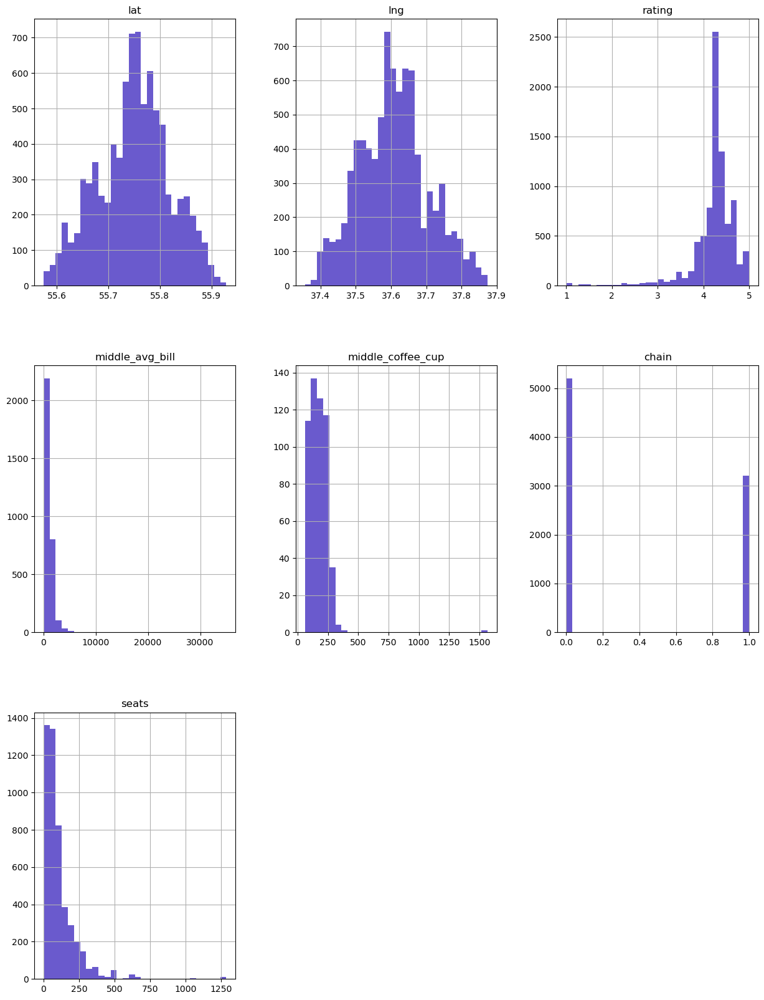

In [7]:
# знакомлюсь с числовыми данными
data.hist(bins=30, figsize=(15,20), color='slateblue')
plt.show()

Географические данные распределены нормально.  
Основной массив данных о рейтинге — в диапазоне от 4 до 5.  
У цены чашки капучино и количестве посадочных мест наблюдаются выбросы.   
В столбце `chain` всего два значения, по каждому есть наблюдения.

## Предобработка данных

In [8]:
# считаю пропуски
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В столбце с часами работы немного пропусков, однако столбец не будет учтён при дальнейшем анализе — оставим пропуски. Тоже самое касается цены и среднего чека.   
Заполним пропуски в столбцах, которые возьмём для для анализа:

In [9]:
# заменяю пропуски
data[['middle_avg_bill', 'seats', 'middle_coffee_cup']] = \
data[['middle_avg_bill', 'seats', 'middle_coffee_cup']].fillna(-1.0)

In [10]:
# считаю дупликаты
data.duplicated().sum()

0

Явных дупликатов в датасете не обнаружено.  

Проверим наличие неявных дупликатов:

In [11]:
# считаю уникальные значения названий заведений
data['name'].nunique()

5614

In [12]:
# привожу столбец названий к нижнему регистру
data['name'] = data['name'].str.lower()
data['name'].nunique()

5512

После предобработки столбца названий заведений осталось 5512 уникальных значений.

In [13]:
data['name'].value_counts()

кафе                189
шоколадница         120
домино'с пицца       77
додо пицца           74
one price coffee     72
                   ... 
ах... плов            1
прошу к столу         1
кофе-порт             1
сметана               1
kebab time            1
Name: name, Length: 5512, dtype: int64

In [14]:
# считаю уникальные значения адресов заведений
data['address'].nunique()

5753

In [15]:
# привожу столбец адресов к нижнему регистру
data['address'] = data['address'].str.lower()
data['address'].nunique()

5752

Среди уникальных адресов был удален только один, осталось 5752.

In [16]:
data['address'].value_counts()

москва, проспект вернадского, 86в           28
москва, усачёва улица, 26                   26
москва, площадь киевского вокзала, 2        20
москва, ярцевская улица, 19                 20
москва, пресненская набережная, 2           16
                                            ..
москва, ярославское шоссе, 19, стр. 1        1
москва, улица арбат, 29                      1
москва, улица арбат, 21, стр. 1              1
москва, малахитовая улица, 3                 1
москва, чонгарский бульвар, 26а, корп. 1     1
Name: address, Length: 5752, dtype: int64

In [17]:
# считаю количество дупликатов после предобработки
data[['name', 'address']].duplicated().sum()

4

In [18]:
# удаляю найденные дупликаты
data = data.drop_duplicates()
data.duplicated().sum()

0

Теперь очистим датасет от аномальных значений:

In [19]:
# избавляюсь от аномалий
data = data[
    (data['seats'] < np.percentile(data['seats'], 99)) &
    (data['middle_avg_bill'] < np.percentile(data['middle_avg_bill'], 99)) & 
    (data['middle_avg_bill'] != 0) &
    (data['middle_coffee_cup'] < np.percentile(data['middle_coffee_cup'], 99))
]
data.shape

(8130, 14)

Было удалено 276 аномальных записей.  
После обновления остаётся 8130.


In [20]:
# создаю столбец с названиями улиц
data['street'] = data['address'].str.split(',', expand=True)[1]
data[['street']].head()

,street
0,улица дыбенко
1,улица дыбенко
2,клязьминская улица
3,улица маршала федоренко
4,правобережная улица


In [21]:
# создаю столбец с обозначением круглосуточных заведений
data['is_24/7'] = np.where(data['hours'] == 'ежедневно, круглосуточно', True, False)
data[['hours', 'is_24/7']]

,hours,is_24/7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
...,...,...
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True


Создали столбцы с названиями улиц и указанием круглосуточности заведения.

Переходим к анализу.

## Исследовательский анализ

### Категории заведений

#### общее распределение

In [22]:
# считаю количество заведений по категориям
categories = data['category'].value_counts().reset_index()
categories.columns = ['category', 'total']
categories.sort_values(by='total', ascending=False)

fig = px.bar(categories.sort_values(by='total', ascending=True),
             x='total',
             y='category',
             orientation='h',
             text='total',
             color='total',
             labels=categories['category'],
             title='Распределение заведений по категориям')
fig.update_layout(xaxis_title='Число заведений',
                 yaxis_title='Категория')
fig.show()

По количеству заведений лидирует категория кафе.   
С небольшим отрывом отстаёт ресторан. Бары и пабы, пиццерии и заведения быстрого питания распределены примерно одинаково. Меньше всего в городе столовых и булочных. 

#### по чеку

In [23]:
# смотрю распределение медианного чека по категориям
median_bill = (data
               .query('middle_avg_bill != -1')
               .groupby( 'category', as_index=False)
               .agg({'middle_avg_bill':'median'})
               .sort_values(by='middle_avg_bill', ascending=False)
              )
fig = px.bar(median_bill.sort_values(by='middle_avg_bill', ascending=True),
             x='middle_avg_bill',
             y='category',
             color='middle_avg_bill',
             text='middle_avg_bill',
             orientation='h',
             title='Медианный чек по категориям')
fig.update_layout(xaxis_title='Медианный чек',
                 yaxis_title='Категория')
fig.show()

Лидирует категория паб/бар - 1250 рублей.   
Затем с небольшим отрывом отстает ресторан — чуть выше 1110 рублей. Остальные категории уже имеют чек меньше 1000 рублей, замыкает список категория столовые с чеком в 300 рублей.

#### по общему числу посадочных мест

In [24]:
# считаю общее число посадочных мест по категориям
total_seats = (data
               .query('seats > 0')
               .groupby('category')
               .agg({'seats':'sum'})
               .sort_values(by='seats', ascending=True))
fig = px.bar(total_seats,
             orientation='h',
             color='value',
             text='value',
             title='Распределение общего числа посадочных мест по категориям',
             )
fig.update_layout(xaxis_title='Число посадочных мест',
                 yaxis_title='Категория')
fig.show()

По общему числу посадочных мест лидируют рестораны.   
Затем идут кафе, после - кофейни. Далее распределение аналогичное количеству заведений в городе. 

#### по медианному числу посадочных мест

In [25]:
# считаю медианное число посадочных мест по категориям
median_seats = (data
                .query('seats != -1')
                .groupby('category')
                .agg({'seats':'median'})
                .sort_values(by='seats', ascending=True)
               )
fig = px.bar(median_seats,
             orientation='h',
             color='value',
             text='value',
             title='Медианное распределение посадочных мест по категориям')
fig.update_layout(xaxis_title='Медианное количество посадочных мест',
                 yaxis_title='Категория')
fig.show()

С медианным количеством картина меняется - лидером по прежнему остаётся ресторан, однако второе место уже занимают бары.  
Далее по популярности следуют столовые и кофейни , затем - предприятия быстрого питания, после - кафе. Замыкают список пиццерии и булочные.  

### Сетевые заведения

#### по типу

In [26]:
# смотрю распределение по сетевым и несетевым заведениям
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
labels = ['несетевые', 'сетевые']

fig = px.pie(chain, 
             values='count', 
             names=labels, 
             color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_layout(title='Распределение по типу заведений',
                  width=600, 
                  height=500,
                  annotations=[dict(x=1.12, 
                                    y=1.05,
                                    text='Тип заведения',
                                    showarrow=False)])

fig.show() 

Из графика видим, что сетевых заведений - 38% от общего количества.
Несетевые заведения преобладают на рынке - их 62%.

#### по категориям

In [27]:
# смотрю отношение сетевых заведений к общему числу
category_chain = (data
                  .pivot_table(index='category', 
                                  columns='chain', 
                                  values='name', 
                                  aggfunc='count')
                  .sort_values(by=1, ascending=False)
                 )
category_chain.columns=['not_chain', 'chain']
category_chain['total'] = category_chain['not_chain'] + category_chain['chain']
category_chain['perc_chain'] = round(
    ((category_chain['chain'] / (category_chain['chain'] + category_chain['not_chain'])) * 100), 2
)
category_chain = category_chain.reset_index()

fig = px.bar(category_chain.sort_values(by=['perc_chain', 'category'], ascending=True),
             x='perc_chain',
             y='category',
             color='perc_chain',
             text='total',
             title='Доля сетевых заведений от общего количества')

fig.update_layout(xaxis_title='Процент сетевых заведений от общего числа',
                 yaxis_title='Категория')


fig.show()

Самая частая категория сетевых заведений - булочные, их более 61%.  
Далее следуют пиццерии (52%), кофейни (49%). Сети быстрого питания располагают 38% сетевых заведений.   
Рестораны и кафе преобладают количественно, располагая 36% и 32% сетевых заведений соответственно. Столовые имеют 27% сетевых заведений. Бары замыкают рейтинг с 22% сетевых заведений в категории.

#### по наименованиям

In [28]:
# смотрю названия популярных сетевых заведений
chain_places = (data
               .query('chain == 1')
               .groupby('name')['address']
               .count()
               .reset_index()
               .sort_values(by='address', ascending=False)
               .head(15)
               )

fig = px.bar(chain_places.sort_values(by='address', ascending=True),
             x='address',
             y='name',
             labels='name',
             orientation='h',
             color='address',
             text='address',
             title='Распределение заведений по названиям сетей')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Наименование сети')

fig.show()

Лидер по количеству точек - Домино'с Пицца.   
Небольшое отставание у Додо Пиццы и One Price Coffee. Также в лидирующих позициях можно отметить Яндекс Лавку, Cofix и Шоколадницу. Замыкают список Буханка, CofeFest и Му-Му.

### Рейтинг по категориям заведений

In [29]:
# смотрю распределение медианных рейтингов по категориям заведений
mean_rating = data.groupby(['category', 'district'], as_index=False)['rating'].mean()
fig = px.bar(mean_rating.sort_values(by='rating', ascending=True), 
       x='rating',
       y='category',
       orientation='h',
       color='rating',
       title='Распределение средних рейтингов по категориям')
fig.update_layout(xaxis_title='Рейтинг',
                  yaxis_title='Категория')

fig.show()

Средние рейтинги у всех категорий приблизительно одинаковые.  
Незначительно лидирует категория бар/паб, а отстаёт - быстрое питание.

### Заведения по округам

#### общее распределение

In [30]:
# смотрю распределение заведений по округам
districts = (data
             .groupby(['district', 'category'], as_index=False)
             .agg({'address':'count'})
             .sort_values(by='address', ascending=False))

fig = px.bar(districts.sort_values(by='address', ascending=True),
       x='address',
       y='district',
       orientation='h',
       text='address',
       title='Распределение заведений по округам',
       color='category',
       color_discrete_sequence=px.colors.qualitative.Prism,
       width=1200)
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Наименование округа')

fig.show()

По количеству заведений лидирует ЦАО, он же лидирует по количеству заведений в каждой категории.   
Затем следуют САО, СВАО, ЮАО с примерно одинаковым количеством заведений. Аутсайдер списка - СЗАО.   
По категориям соотношение примерно одинаковое от района к району - лидируют кафе, после следуют рестораны, затем - кофейни. Замыкают список столовые и булочные.

#### по рейтингу

In [31]:
# визуализирую медианные рейтинги по округам
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=mean_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.7,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

m

Высокий средний рейтинг — в ЦАО  (от 4.28 до 4.32)  
ЮЗАО, ЮАО — от 4.24 до 4.28   
САО и ВАО — от 4.2 до 4.24   
СЗАО — от 4.16 до 4.2 

### Карта всех заведений

In [32]:
# объявляю функцию для создания карты с кластерами точек
def create_map(df):
    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
    marker_cluster = MarkerCluster().add_to(m)

    def create_clusters(row):
        Marker([row['lat'], row['lng']],
                popup=f"{row['name']} {row['rating']}").add_to(marker_cluster)

    df.apply(create_clusters, axis=1)

    return display(m)

In [33]:
# визуализирую все заведения датасета на карте
create_map(data)

Заведения распределены по всем районам Москвы.   
Видим, что заведения часто расположены вдоль основных магистралей и точек притяжения. Редкие заведения встречаются в зелёных и промышленных зонах.

Самый высокий медианный чек в ЦАО - свыше 905 рублей.  
На втором месте ЗАО - диапазон чека от 810 до 905 рублей. 
СЗАО, САО - от 620 до 715 рублей,  ВАО и ЮЗАО имеют медианный чек от 525 до 620 рублей. Остальные районы держат медианный чек в диапазоне от 430 до 525 рублей.

### Популярные улицы

#### по количеству

In [34]:
# нахожу самые популярные улицы по количеству заведений
top_streets = (data
               .groupby(['street', 'category'], as_index=False)
               .agg({'name':'count'})
               .sort_values(by='name', ascending=False)
               .head(15) # не понимаю, почему отображаются не все 15 улиц?
              )

fig = px.bar(top_streets.sort_values(by='name', ascending=False),
       x='name',
       y='street',
       orientation='h',
       title='Популярные улицы по числу заведений',
       color='category',
       color_discrete_sequence=px.colors.qualitative.Prism,
       text='name')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Улица')

fig.show()

Наиболее плотная по количеству заведений улица - проспект Мира (150 заведений).   
Затем следует Ленинский проспект (73), после - Профсоюзная улица (62).  Стоит отметить, что все улицы являются оживлёнными, с большим автомобильным трафиком.   
В категориях чаще всего преобладают кафе либо рестораны. 

#### по рейтингу

In [35]:
# нахожу улицы с высоким рейтингом заведений
rating_streets = (data
               .groupby('street', as_index=False)
               .agg({'rating':'mean', 'name':'count'})
               .sort_values(by='name', ascending=False)
               .head(15)
              )

fig = px.bar(rating_streets.sort_values(by=['rating', 'name'], ascending=True),
       x='rating',
       y='street',
       orientation='h',
       title='Популярные улицы по рейтингам заведений',
       color='rating',
       text='name')
fig.update_layout(xaxis_title='Рейтинг заведений',
                  yaxis_title='Улица')
fig.show()

Выcокий средний рейтинг - у заведений на Пятницкой улице (4.4).   
Также высокие рейтинги у Ленинградского проспекта, улицы Вавилова, проспектов Ленинского и Вернадского. 

Чуть меньшие рейтинги - на вылетных магистралях и МКАД. 
Проспект Мира - самый многочисленный по заведениям, но средний рейтинг не самый высокий (только 4.1).

#### по чеку

In [36]:
# нахожу улицы с высоким чеком 
top_bill_streets = (data
                    .query('middle_avg_bill != -1')
                    .groupby('street', as_index=False)
                    .agg({'middle_avg_bill':'median', 'name':'count'})
                    .sort_values(by='name', ascending=False)
                    .head(15)
                    )

fig = px.bar(top_bill_streets.sort_values(by=['middle_avg_bill', 'name'], ascending=True),
       x='middle_avg_bill',
       y='street',
       orientation='h',
       title='Улицы с высоким медианным чеком',
       color='middle_avg_bill',
       text='name')
fig.update_layout(xaxis_title='Медианный чек',
                  yaxis_title='Улица')
fig.show()

Высокий медианный чек - на Покровке (1100 рублей). Также лидерами можно отметить улицы с чеком в 1000 рублей  
Ленинский проспект  
Пресненская набережная  
Пятницкая улица.  

Можно присмотреться к проспектам Ленинградскому, Вернадского и Кутузовскому - там тоже довольно большие чеки (775-960 рублей) 
А вот проспект Мира, Профсоюзная улица и улица Миклухо-Маклая здесь уже отстают со средним чеком в 600 рублей. 

### Редкие заведения на карте

In [37]:
# визуализирую на карте заведения, которые являются единственными на улице
rare_streets = (data
                .groupby('street', as_index=False)['address'].count()
                .query('address == 1')
               )

rare_streets = rare_streets.merge(data, on='street', how='left')
create_map(rare_streets)

Заведения, являющиеся единственными на улице - либо находятся в глубине микрорайонов, либо около технических сооружений, а также в промзонах и парках. Географической особенности нет, встречаются во всех районах города. 

### Медианный чек по округам

In [38]:
# визуализирую на карте медианный чек по округам
median_avg_bill = (data
                   .query('middle_avg_bill != -1')
                   .groupby('district', as_index=False)['middle_avg_bill']
                   .agg('median')
                   .sort_values(by='middle_avg_bill', ascending=False)
                  )

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.7,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

m

Самый высокий медианный чек в ЦАО - свыше 905 рублей.  
На втором месте ЗАО - диапазон чека от 810 до 905 рублей. 
СЗАО, САО - от 620 до 715 рублей,  ВАО и ЮЗАО имеют медианный чек от 525 до 620 рублей. Остальные районы держат медианный чек в диапазоне от 430 до 525 рублей.

### Другие наблюдения

#### медианное число посадочных мест по округам

In [39]:
# визуализирую на карте медианное число посадочных мест по округам
median_seats = (data
                   .query('seats != -1')
                   .groupby('district', as_index=False)['seats']
                   .agg('median')
                   .sort_values(by='seats', ascending=False)
                  )

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=median_seats,
    columns=['district', 'seats'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.7,
    legend_name='Медианное число посадочных мест по районам',
).add_to(m)

m

По медианному числу мест снова лидирует ЦАО - диапазон от 83 до 90.  
Второе место у ЗАО и СЗАО (77 - 83). Затем идут СВАО и ЮАО (70 - 77).   
А в ВАО и ЮВАО медианный диапазон посадочных мест меньше всех - от 50 до 57.

#### круглосуточные заведения

In [40]:
daynight = data.query('hours == "ежедневно, круглосуточно"')

display(daynight.shape)
create_map(daynight)

(713, 16)

Всего в Москве — 713 круглосуточных заведений, также распределены по всем округам   
Меньше всего встречаются у МКАД. Чаще всего в спальных микрорайонах и на вылетных магистралях.  
Самая активная концентрация - у площади трёх вокзалов. Помимо, высокая плотность заведений у Таганской, Павелецкой и Марьино.

In [41]:
# смотрю распределение рейтинга круглосуточных заведений по категориям
daynight_rating = (daynight
                  .groupby('category')
                  .agg({'address':'count', 'rating':'mean'})
                  .reset_index()
                  .sort_values(by='address', ascending=False)
                 )
fig = px.bar(daynight_rating.sort_values(by='rating', ascending=True),
             x='rating',
             y='category',
             color='rating',
             text='address',
             title='Распределение рейтинга круглосуточных заведений по категориям')
fig.update_layout(xaxis_title='Рейтинг',
                  yaxis_title='Категория')
fig.show()

Лидер в рейтинге круглосуточных заведений - категория столовые (4.25).   
Незначительно отстают рестораны и кофейни (4.2). Также высокий рейтинг у баров/пабов.  
Заведения быстрого питания замыкают список со средним рейтингом 3.9

In [42]:
# смотрю распределение медианного чека круглосуточных заведений по категориям
daynight_bill = (daynight
                 .query('middle_avg_bill != -1')
                 .groupby('category')
                 .agg({'address':'count', 'middle_avg_bill':'median'})
                 .reset_index()
                 .sort_values(by='address', ascending=False)
                 )
fig = px.bar(daynight_bill.sort_values(by='middle_avg_bill', ascending=True),
             x='middle_avg_bill',
             y='category',
             color='middle_avg_bill',
             text='address',
             title='Распределение медианного чека круглосуточных заведений по категориям')
fig.update_layout(xaxis_title='Медианный чек',
                  yaxis_title='Категория')
fig.show()

Самый высокий медианный чек у круглосуточных заведений - в кофейнях (свыше 1800 рублей).   
В барах, занимающих второе место, значительно ниже - 1250 рублей. Рестораны имеют чек лишь 800 рублей   
Остальные категории - меньше 400, аутсайдер списка булочные (лишь 250 рублей).

#### низкий рейтинг по категориям

In [43]:
# смотрю заведения с низким рейтингом по категориям
low_rating = data.query('rating < 3')
low_rating_chart = (low_rating
                    .groupby('category')
                    .agg({'name':'count'})
                    .sort_values(by='name', ascending=False)
                    .reset_index()
)

fig = px.bar(low_rating_chart.sort_values(by='name', ascending=False),
       x='name',
       y='category',
       orientation='h',
       title='Распределение заведений с низким рейтингом по категориям',
       color='category',
       color_discrete_sequence=px.colors.qualitative.Prism,
       text='name')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Категория')
fig.show()

Если рассматривать антирейтинги - лидером из худших являются кафе.   
Затем следуют рестораны и заведения общественного питания. Остальные категории встречаются не так часто, меньше всего - булочные. 

In [44]:
# визуализирую на карте заведения с низким рейтингом
create_map(low_rating)

Можем видеть, что большинство заведений имеют не самое удачное расположение - находятся не в близи к метро/проходным улицам, либо в промзонах или у инфраструктурных объектов. Также встречаются заведения в торговых центрах, здесь предположительно низкий рейтинг может быть из-за высокой конкуренции.

#### низкий рейтинг по улицам

In [45]:
# смотрю распределение заведений с низким рейтингом по улицам
low_rating_street = (low_rating
                    .groupby('street')
                    .agg({'name':'count', 'rating':'mean'})
                    .sort_values(by='name', ascending=False)
                    .query('name > 2')
                    .reset_index()
)

fig = px.bar(low_rating_street.sort_values(by='rating', ascending=False),
       x='rating',
       y='street',
       orientation='h',
       title='Распределение заведений с низким рейтингом по улицам',
       color='rating',
       text='name')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Улица')
fig.show()

Улицы с низким рейтингом и количеством заведений больше двух - Шарикоподшипниковская улица, а также Профсоюзная улица и Новоясеневский проспект, где целых 8 заведений имеют рейтинг меньше 3.   

В целом же, данные улицы либо с большим трафиком, либо находятся в промзонах или отдалённых районах. 

#### низкий рейтинг по чеку

In [46]:
# смотрю распределение по чекам в заведениях с низким рейтингом
low_rating_bill_chart = (low_rating
                  .query('middle_avg_bill != -1')
                  .groupby('category')['middle_avg_bill']
                  .median()
                  .reset_index()
)

fig = px.bar(low_rating_bill_chart.sort_values(by='middle_avg_bill', ascending=True), 
             x='middle_avg_bill',
             y='category',
             color='middle_avg_bill',
             text='middle_avg_bill',
             orientation='h',
             title='Распределение чека заведений с низким рейтингом по категориям')
fig.update_layout(xaxis_title='Медианный чек',
                  yaxis_title='Категория')               
fig.show() 

Можем видеть, что некоторые категории отсутствуют.   
Так, в списке заведений с низким рейтингом нет кофеен, баров и ресторанов. 

В антирейтинге заведений по чеку лидируют пиццерии (950 рублей), затем идут кафе (725 рублей). Равный чек имеют булочные и быстрое питание (325 рублей). Наименьший чек в столовых - 237 рублей.

#### низкий чек по категориям

In [47]:
# смотрю распределение заведений с низким чеком по категориям
low_bill = data.query('0 < middle_avg_bill <= 300')
low_bill_chart = (low_bill
                    .groupby('category')
                    .agg({'name':'count', 'middle_avg_bill':'median'})
                    .sort_values(by='name', ascending=False)
                    .reset_index()
)

fig = px.bar(low_bill_chart.sort_values(by='middle_avg_bill', ascending=True),
       x='middle_avg_bill',
       y='category',
       orientation='h',
       title='Распределение заведений с низким чеком по категориям',
       color='middle_avg_bill',
       text='name')
fig.update_layout(xaxis_title='Медианный чек',
                  yaxis_title='Категория')
fig.show()

Среди заведений с низким чеком лидируют бары — *212 рублей*  
Булочные и быстрое питание на втором месте (*230 рублей*). В ресторанах среди остальных категорий чек выше — *300 рублей*.

#### низкий чек по улицам

In [48]:
# смотрю распределение заведений с низким чеком по улицам
low_bill_street = (low_bill
                    .groupby('street')
                    .agg({'middle_avg_bill':'median', 'name':'count'})
                    .sort_values(by='middle_avg_bill', ascending=False)
                    .reset_index()
                    .query('name > 2')
                    .head(10)
)

fig = px.bar(low_bill_street.sort_values(by=['middle_avg_bill', 'name'], ascending=True),
       x='middle_avg_bill',
       y='street',
       orientation='h',
       title='Распределение заведений с низким чеком по улицам',
       color='middle_avg_bill',
       text='name')
fig.update_layout(xaxis_title='Медианный чек',
                  yaxis_title='Улица')
fig.show()

Ленинградское шоссе имеет больше всего заведений с низким чеком.   
В списке есть центральные улицы и те, которые расположены на востоке. Возможно, там находятся студенческие заведения или проходные точки с небольшим чеком. Однако географической корреляции не наблюдается.

#### медианный чек и рейтинг заведения

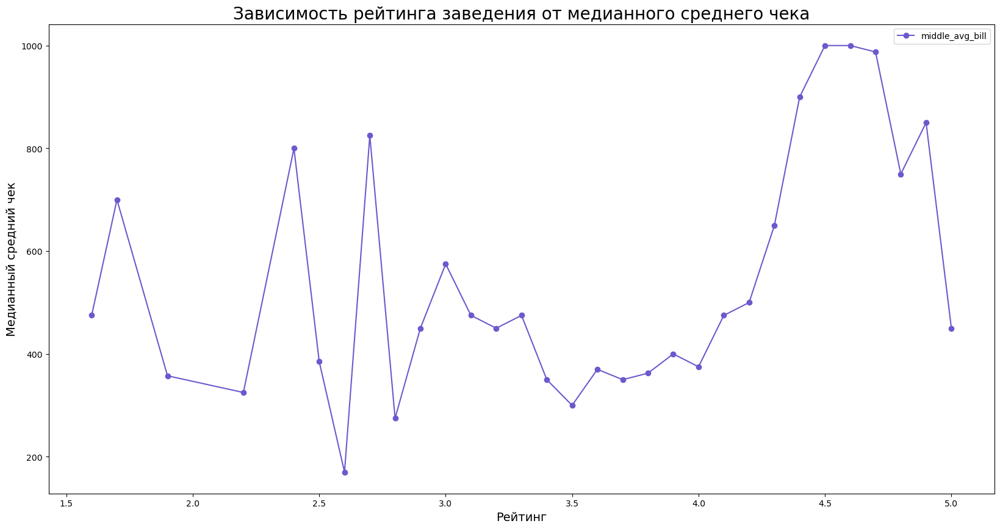

In [49]:
# смотрю зависимость рейтинга заведения от медианного среднего чека
(data
 .query('middle_avg_bill != -1 & middle_avg_bill < 2000')
 .pivot_table(index='rating', 
             values='middle_avg_bill', 
            aggfunc='median')
 .plot(style='o-', 
       figsize=(20,10), 
       color='slateblue')
)
plt.title('Зависимость рейтинга заведения от медианного среднего чека', size=20)
plt.xlabel('Рейтинг', size=14)
plt.ylabel('Медианный средний чек', size=14)
plt.show()

Прямой зависимости между медианным чеком и рейтингом заведения не обнаружено. 

Посмотрим, есть ли другие корреляции в данных:

In [50]:
# проверяю на другие зависимости
data.corr()

C:\Users\DNS\AppData\Local\Temp\ipykernel_26852\1550913332.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
lat,1.000000,-0.133781,0.029766,0.023822,0.022883,-0.019222,-0.010081,-0.011335
lng,-0.133781,1.000000,-0.016736,-0.052397,-0.008716,-0.045364,-0.082511,0.034908
rating,0.029766,-0.016736,1.000000,0.145891,0.059900,-0.012462,0.029353,-0.103216
middle_avg_bill,0.023822,-0.052397,0.145891,1.000000,-0.131679,-0.040129,0.108699,-0.064333
middle_coffee_cup,0.022883,-0.008716,0.059900,-0.131679,1.000000,-0.002790,-0.020486,-0.058233
chain,-0.019222,-0.045364,-0.012462,-0.040129,-0.002790,1.000000,0.060400,0.026067
seats,-0.010081,-0.082511,0.029353,0.108699,-0.020486,0.060400,1.000000,-0.031637
is_24/7,-0.011335,0.034908,-0.103216,-0.064333,-0.058233,0.026067,-0.031637,1.000000


Больше корреляций в данных не обнаружено.

### Вывод 

Мы провели исследовательский анализ и выяснили следующее:  

1. По числу заведений лидируют *кафе (2350)* и *рестораны (1938)*. Столовых и булочных меньше всего
2. Высокий чек в *барах (1250 ₽)* и *ресторанах (1112 ₽)*
3. Медианное распределение посадочных мест больше в *ресторанах (82)* и *барах (80)*. Меньше мест в пиццериях и булочных  
4. *Несетевых* заведений в городе больше — *62%* против 32% сетевых 
5. Доля сетевых самая высокая у *булочных (61%)* и *пиццерий (52%)*. Реже встречаются столовые и бары.  
6. Лидеры сетей по количеству точек — *пиццерии Домино'с (76) и Додо (74)*
7. *Рейтинг* по категориям в целом не меняется и составляет *4.2*. Однако если рейтинг низкий, вероятность его получить больше у кафе. 
8. По округам рейтинг выше в *ЦАО (4.3)*. Ниже всего в СВАО, ЗАО и ЮВАО.
9. Также в *ЦАО* больше всего заведений — *2129*. Меньше всего — в СВАО. 
10. Самая плотная улица по числу заведений — *проспект Мира (150)*. Также лидируют Ленинский проспект и Профсоюзная улица
11. Улица с наивысшим рейтингом заведений — *Пятницкая (4.4)*.Высокую оценку получили Ленинградский проспект, улица Вавилова, а также проспекты Вернадского и Ленинский. А низкий рейтинг часто получают улицы в промышленных кварталах
12. Улицы с высоким чеком — *Покровка (1100 ₽)*, а также чек в 1000 ₽ на проспектах Ленинском и Ленинградском, Пресненской набережной и Пятницкой улице  
13. *Круглосуточных заведений — 713* (12% от общего числа). В них самый высокий чек — у *кофеен (1875 ₽)*, а ниже — в булочных.

## Кофейни

In [51]:
# объявляю переменную для кофеен
coffee = data.query('category == "кофейня"')
coffee.shape

(1308, 16)

Всего в Москве 1308 кофеен.

In [52]:
coffee.query('middle_avg_bill != -1  and seats != -1').agg({'seats':'median',
                                                            'middle_avg_bill':'median',
                                                            'rating':'mean'})

seats               72.000000
middle_avg_bill    400.000000
rating               4.307207
dtype: float64

В кофейнях Москвы в среднем 72 посадочных места, чек — 400 рублей, а рейтинг — 4.3.

### на карте

In [53]:
# визуализирую на карте кофейни

create_map(coffee)

Кофейни сосредоточены по всем районам Москвы.   
Располагаются в парках, у метро, внутри микрорайонов, на оживленных и не очень улицах. В спальных районах — часто в торговых центрах. По мере приближения к центру распределяются хаотично. Однозначной географической зависимости не наблюдается.

### по районам 

In [54]:
# смотрю распределение кофеен по районам
coffee_districts = coffee.groupby('district', as_index=False).agg({'rating':'mean', 'address':'count'})

fig = px.bar(coffee_districts.sort_values(by='address', ascending=True), 
       x='address',
       y='district',
       orientation='h',
       color='rating',
       text='address',
       title='Распределение количества кофеен по округам')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Округ')
fig.show()

Больше всего кофеен — в ЦАО   
Замыкает список по количеству кофеен — СЗАО. А вот рейтинг по округам практически не различается и колеблется от 4.2 до 4.3. Лидерами можно отметить ЦАО и СЗАО.

### круглосуточные

In [55]:
# визуализирую круглосуточные кофейни на карте
daynight_coffee = coffee.query('hours == "ежедневно, круглосуточно"')

create_map(daynight_coffee)

Круглосуточные кофейни распределены неравномерно — большая часть находится в ЦАО и ЗАО.  
На окраинах города встречаются единично. Также есть пара точек на МКАД. Самая большая концентрация — на площади трёх вокзалов.

In [56]:
display(daynight_coffee.shape)
daynight_coffee.query('middle_avg_bill != -1  and seats != -1').agg({'seats':'median', 
                                                                     'middle_avg_bill':'median', 
                                                                     'rating':'mean'})

(49, 16)

seats                79.0000
middle_avg_bill    1625.0000
rating                4.3375
dtype: float64

Всего в Москве 49 круглосуточных кофеен.

Рейтинг — 4.3  
Число посадочных мест — 79  
Средний чек — 1625 рублей  

### по улицам 

In [57]:
# нахожу самые популярные улицы по количеству кофеен
top_coffee_streets = (coffee
                    .groupby('street', as_index=False)
                    .agg({'name':'count'})
                    .sort_values(by='name', ascending=False)
                    .head(15)
                    )

fig = px.bar(top_coffee_streets.sort_values(by='name', ascending=True),
       x='name',
       y='street',
       orientation='h',
       color='name',
       text='name',
       title='Популярные улицы по количеству кофеен')
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Улица')
fig.show()

Среди популярных улиц мы снова видим проспект Мира, Профсоюзную улицу и Ленинский проспект.    
А вот Пятницкая улица оказалась внизу списка, вместе с Алтуфьевским шоссе и улицей Миклухо-Маклая. 

### по рейтингу

In [58]:
# нахожу улицы с высоким рейтингом кофеен
rating_coffee_streets = (data
                         .groupby('street', as_index=False)
                         .agg({'rating':'mean', 'address':'count'})
                         .sort_values(by=['rating', 'address'], ascending=False)
                         .query('address > 2')
                         .head(15)
                         )

fig = px.bar(rating_coffee_streets.sort_values(by='rating', ascending=True),
       x='rating',
       y='street',
       orientation='h',
       color='rating',
       text='address',
       title='Улицы с высоким рейтингом кофеен')
fig.update_layout(xaxis_title='Рейтинг',
                  yaxis_title='Улица')
fig.show()

Высокий рейтинг кофеен — в Коломенском.  
Среди списка есть несколько парков или улиц, расположенных поблизости таких зон — наталкивает на мысль о том, что может существовать положительная корреляция оценки кофейни и расположения её ближе к природе.


#### по чеку

In [59]:
# нахожу улицы с высоким чеком кофеен
bill_coffee_streets = (data
                       .query('middle_avg_bill != -1')
                       .groupby('street', as_index=False)
                       .agg({'middle_avg_bill':'median', 'address':'count'})
                       .sort_values(by='middle_avg_bill', ascending=False)
                       .query('address > 2')
                       .head(15)
                         )

fig = px.bar(bill_coffee_streets.sort_values(by='middle_avg_bill', ascending=True),
       x='middle_avg_bill',
       y='street',
       orientation='h',
       color='middle_avg_bill',
       text='address',
       title='Улицы с высоким чеком кофеен')
fig.update_layout(xaxis_title='Медианный чек',
                  yaxis_title='Улица')
fig.show()

Большинство улиц располагаются в ЦАО  
Лидируют Большая Никитская улица и Овчинниковская набережная — чек 2500 рублей.

### стоимость чашки капучино

In [60]:
# смотрю медианную стоимость чашки капучино
display(coffee.query('middle_coffee_cup != -1').agg({'middle_coffee_cup':'median'}))
coffee.query('middle_coffee_cup != -1 and district == "Центральный административный округ"').agg({'middle_coffee_cup':'median'})

middle_coffee_cup    150.0
dtype: float64

middle_coffee_cup    174.0
dtype: float64

Медианная стоимость чашки капучино по городу — 150 рублей    
Если рассматривать открытие кофейни в ЦАО — следует ориентироваться на стоимость свыше 170 рублей.

## Презентация

Ознакомиться с основными тезисами исследования можно по ссылке:  
https://drive.google.com/file/d/17tTf4B4QBIYb2zyzpImkD3oI9fISytHg/view?usp=drive_link

## Вывод

Мы провели исследование рынка заведений общественного питания Москвы. 

1. При первичном знакомстве с данными были обнаружены пропуски — вероятно, обусловлены они человеческим фактором, поскольку не все добавляют полную информацию о месте. Также это могут быть технические ошибки, связанные с обработкой этих данных.  


2. При предобработке были исключены аномальные данные, потеря составила порядка 3% всех записей — это допустимо.  


3. Общий исследовательский анализ показал:  

 3.1 В категории заведения лидирует *кафе (2350 заведений)*   
 3.2 По количеству посадочных мест — *ресторан (около 80 мест)*  
 3.3 По медианному чеку — *бар/паб (1250 рублей)*  
 
 3.4 Сетевые заведения уступают, на рынке больше *несетевых* заведений (62% против 38%)   
 3.5 Среди сетевых популярны булочные, однако они малочисленны. Кафе преобладает по числу заведений, но доля сетевых лишь 30%  
 3.6 Самые популярные сети — *Домино'с Пицца* и *Додо Пицца*   
 
 3.7 По среднему рейтингу заведений разницы в категориях — нет   
 3.8 По районам средний рейтинг также колеблется не сильно — от *4.2* до *4.3*
 
 3.8 Наибольшее число заведений — в *ЦАО (2129 заведений)*   
 3.10 Высокий медианный чек (*905-100 рублей* и наибольшее число посадочных мест (*83-90*) в *ЦАО*  
 
 3.11 *Круглосуточные заведения* распределены по всем районам, высокая концентрация в *ЦАО* (в частности у площади трёх вокзалов), а также у Таганской, Павелецкой и в Марьино  
 3.12 По среднему рейтингу круглосуточных заведений лидирует категория *паб/бар*, по чеку — *кофейни (1875 рублей)*  
 3.13 Самая популярная улица по количеству заведений — *проспект Мира (150 заведений)*  
 3.14 По чеку — *улица Покровка (1100 рублей)*  
 3.15 По рейтингу — *Пятницкая улица (4.4)*


4. Анализ кофеен:

 4.1 Всего в Москве — *1308 кофеен*   
 4.2 Лидеры по числу кофеен: округ — *ЦАО*, улица — *проспект Мира*    
 4.3 Высокие рейтинги могут получать кофейни, которые расположены *в парках* или поблизости зелёных зон    
 4.4 Самые высокие чеки в ЦАО, на *Большой Никитской улице и Овчинниковской набережной — 2500 рублей*  
 4.4 Медианная стоимость чашки капучино — *150 рублей* по городу и *170 рублей* — в *ЦАО*  
 4.5 Круглосуточные кофейни имеют средний чек *1625 рублей*  
 

5. *Рекомендации* 

При выборе места для открытия кофейни стоит присмотреться к округам ЦАО и ВАО. А именно — хорошо искать помещения около Покровки, Сити, Кутузовского и Ленинского проспектов, а также Большой Никитской улицы и Овчинниковской набережной — у этих районов перспективное соотношение чека и рейтинга.   
Также имеет смысл ориентироваться на наличие поблизости парковых зон, скверов или водоёмов.   
При открытии заведения, ориентироваться на стоимость чашки капучино около 170 рублей.  
Сравнить возможности обеспечения круглосуточного обслуживания — это может повысить стоимость среднего чека в несколько раз. 
